









# Importar a tabela com as features e rótulos

**Importante**: para rodar esse notebook, é necessário criar um atalho na raiz do seu Google Drive para a pasta do Grupo 1 no Google Drive da sala e ter as permissões de acesso adequadas. Siga o passo a passo no notebook [neste link](https://colab.research.google.com/drive/1gcgucA_kH5xj9dncwh1sUfaLRROkbm3G#scrollTo=GJe2F3xyOayd), substituindo a pasta "Base" por "Grupo 1 - RappiIA" 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df_infos = pd.read_csv('/content/drive/MyDrive/Grupo 1 - RappIA /features.csv', index_col=0)
df_infos

,ID,IS_CHURN,LEVEL_NAME,AUTO_ACCEPT,ACCEPTANCE_RATE,ORDERS_DONE,ORDERS_LAST_30D_COUNT,ORDERS_CANCEL,ORDERS_CANCELED_LAST_30D_COUNT,FIRST_ORDER_DATE,...,PRODUCT_RETURNS,SUPPORT_TICKET_COUNT,DEFECTS_COUNT,AVG_DISTANCE_TO_USER,TRANSPORT_bicycle,TRANSPORT_car,TRANSPORT_motorbike,TRANSPORT_neither,TRANSPORT_cargo_van,TRANSPORT_motorbike_trailer
0,1552668,False,1,True,1.00000,0,4,1,0,738354,...,0.000,0,2,3.765437,0,0,1,0,0,0
1,1552649,False,3,True,0.77800,4,122,1,2,738353,...,0.000,0,8,4.014581,0,0,1,0,0,0
2,1552604,False,2,True,1.00000,3,57,0,1,738353,...,0.000,0,9,1.517087,1,0,0,0,0,0
3,1552588,False,4,True,0.00000,1,59,0,2,738354,...,0.000,0,7,2.256725,0,1,0,0,0,0
4,1552553,False,1,True,0.88870,3,9,0,0,738353,...,0.000,0,5,2.736529,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159523,33189,True,2,True,0.16240,396,0,17,0,738005,...,-2.145,101,105,2.074419,0,1,0,0,0,0
159524,33188,True,0,False,0.89450,12,0,1,0,738089,...,0.000,57,3,4.168917,0,0,1,0,0,0
159525,33161,True,2,False,0.45120,2625,4,55,1,738003,...,-72.440,0,227,3.668000,0,0,1,0,0,0
159526,33051,True,2,True,0.80570,2311,0,49,0,738089,...,-0.025,28,104,1.318292,1,0,0,0,0,0


# Separar as features dos rótulos

In [ ]:
from sklearn.model_selection import train_test_split

# Dividindo x e y
# features que estão com algum problema: X = df_infos[[ 'ORDERS_CANCELED_LAST_30D_COUNT', 'ORDERS_LAST_30D_COUNT', 'LAST_ORDER_DATE', 'SUPPORT_TICKET_COUNT']]
X = df_infos[[
              'LEVEL_NAME', 
              'AUTO_ACCEPT', 'ACCEPTANCE_RATE', 
              'ORDERS_DONE', 
              'ORDERS_CANCEL', 
              'FIRST_ORDER_DATE', 
              'EARNINGS', 'TIPS', 
              'PUNISHMENT_MINUTES', 'PRODUCT_RETURNS', 
              'DEFECTS_COUNT', 
              'AVG_DISTANCE_TO_USER', 
              'TRANSPORT_bicycle','TRANSPORT_car', 'TRANSPORT_motorbike', 'TRANSPORT_neither', 'TRANSPORT_cargo_van', 'TRANSPORT_motorbike_trailer',
            ]]
y = df_infos[['IS_CHURN']]



# Separar datasets de teste e de treino

In [ ]:
# Dividindo dados para treino e dados para teste
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size = 0.3, 
                                                    random_state = 42)

In [ ]:
X_train.shape

(111669, 18)

In [ ]:
y_train.shape

(111669, 1)

# Normalizar os dados

In [ ]:
from sklearn.preprocessing import RobustScaler, StandardScaler
robust_scaler = RobustScaler()
robust_scaler.fit(X_train)

X_train = pd.DataFrame(robust_scaler.fit_transform(X_train), columns = X_train.columns)
X_test = pd.DataFrame(robust_scaler.transform(X_test), columns = X_test.columns)

standard_scaler = StandardScaler()
standard_scaler.fit(X_train)

X_train = pd.DataFrame(standard_scaler.fit_transform(X_train), columns = X_train.columns)
X_test = pd.DataFrame(standard_scaler.transform(X_test), columns = X_test.columns)

# Fazer o undersampling

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

rus = RandomUnderSampler(random_state=0)
X_train, y_train = rus.fit_resample(X_train, y_train)

In [ ]:
X_train.shape

(40042, 18)

In [ ]:
y_train.shape

(40042, 1)

# Treinar e avaliar os modelos

## Regressão Logística

### Treinar

In [ ]:
from sklearn.linear_model import LogisticRegression

# Criando o modelo
lr = LogisticRegression()
lr.fit(X_train, y_train.squeeze())

# Predizendo
y_pred = lr.predict(X_test)

### Avaliar

In [ ]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score

In [ ]:
print('Acc treino', lr.score(X_train, y_train))
print('Acc teste', lr.score(X_test, y_test.squeeze()))

Acc treino 0.7982368513061285
Acc teste 0.8106312292358804


In [ ]:
print('Revocação', recall_score(y_test, y_pred))
print('Precisão', precision_score(y_test, y_pred))
print('F1 Score', f1_score(y_test, y_pred))

Revocação 0.8130535184104347
Precisão 0.9497272942850368
F1 Score 0.8760920388827366


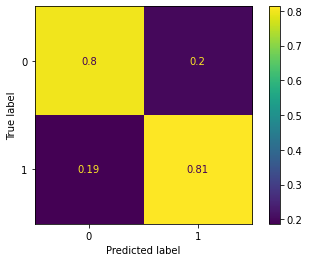

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred, normalize='true')
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

### Importância das Features

Feature: LEVEL_NAME, Score: -0.67995
Feature: AUTO_ACCEPT, Score: -0.22659
Feature: ACCEPTANCE_RATE, Score: 0.26698
Feature: ORDERS_DONE, Score: -0.02824
Feature: ORDERS_LAST_30D_COUNT, Score: 0.00017
Feature: ORDERS_CANCEL, Score: -1.23620
Feature: ORDERS_CANCELED_LAST_30D_COUNT, Score: 0.54903
Feature: FIRST_ORDER_DATE, Score: 0.30491
Feature: LAST_ORDER_DATE, Score: 1.27493
Feature: EARNINGS, Score: -0.19386
Feature: TIPS, Score: -1.93939
Feature: PUNISHMENT_MINUTES, Score: 0.05252
Feature: PRODUCT_RETURNS, Score: 0.11862
Feature: SUPPORT_TICKET_COUNT, Score: -0.00215
Feature: DEFECTS_COUNT, Score: -0.11038
Feature: AVG_DISTANCE_TO_USER, Score: -0.02978
Feature: TRANSPORT_bicycle, Score: 0.02581
Feature: TRANSPORT_car, Score: -0.00357


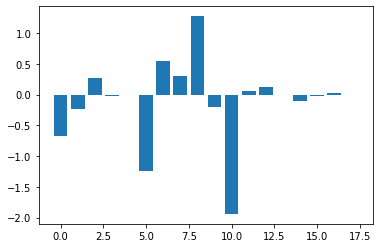

In [ ]:
import matplotlib.pyplot as plt

# Avaliar a importância das features
importance = lr.coef_[0]
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %s, Score: %.5f' % (df_infos.columns.values[i + 2],v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

## GradientBoostingClassifier

### Treinar

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

#Criando modelo
gb = GradientBoostingClassifier()

#Treinando modelo
gb.fit(X_train, y_train.squeeze())
y_pred = gb.predict(X_test)

### Avaliar

In [ ]:
print('Acc treino', gb.score(X_train, y_train))
print('Acc teste', gb.score(X_test, y_test.squeeze()))

Acc treino 0.8538035063183658
Acc teste 0.861133747048622


In [ ]:
print('Revocação', recall_score(y_test, y_pred))
print('Precisão', precision_score(y_test, y_pred))
print('F1 Score', f1_score(y_test, y_pred))

Revocação 0.8671048290912782
Precisão 0.9603979875769415
F1 Score 0.9113701224228522


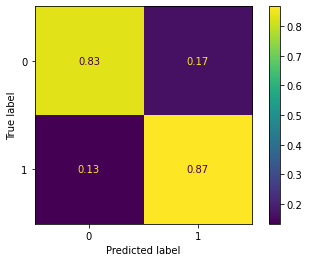

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred, normalize='true')
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

### Model Tuning (Otimizar Hiperparâmetros)

In [ ]:
gb.get_params().keys()

dict_keys(['ccp_alpha', 'criterion', 'init', 'learning_rate', 'loss', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_iter_no_change', 'random_state', 'subsample', 'tol', 'validation_fraction', 'verbose', 'warm_start'])

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

parameters = {
    'loss': ['deviance', 'exponential'],
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
    'n_estimators': [100, 200, 300, 400, 500],
    'subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9, 10],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'min_weight_fraction_leaf': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5],
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
    'min_impurity_decrease': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5],
    'init': [None],
    'max_features': ['auto', 'sqrt', 'log2'],
    'random_state': [42]
}

clf = RandomizedSearchCV(gb, parameters, n_iter=10, verbose=2)

clf.fit(X_train, y_train.squeeze())

In [ ]:
print(clf.best_params_)
print(clf.best_score_)
best_gb = clf.best_estimator_

{'subsample': 0.6, 'random_state': 42, 'n_estimators': 200, 'min_weight_fraction_leaf': 0.1, 'min_samples_split': 9, 'min_samples_leaf': 2, 'min_impurity_decrease': 0.1, 'max_features': 'sqrt', 'max_depth': 8, 'loss': 'deviance', 'learning_rate': 0.1, 'init': None}
0.845112772107403


In [ ]:
print('Acc treino: ', best_gb.score(X_train, y_train ))
print('Acc teste: ', best_gb.score(X_test, y_test.squeeze() ))

y_pred = best_gb.predict(X_test)
print( 'Revocação: ', recall_score( y_test, y_pred ))
print( 'Precisão: ', precision_score( y_test, y_pred ))
print( 'F1_score: ', f1_score( y_test, y_pred ))

Acc treino:  0.8490335148094501
Acc teste:  0.8505192335819804
Revocação:  0.8544421041946862
Precisão:  0.9595884750206617
F1_score:  0.903967998281787


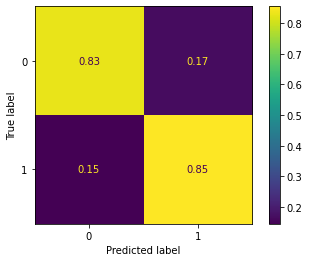

In [ ]:
cm = confusion_matrix(y_test, y_pred, normalize='true')
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

## Light GBM

### Treinar

In [ ]:
import lightgbm as lgb

# Criando o modelo
lgb_model = lgb.LGBMClassifier()
lgb_model.fit(X_train, y_train.squeeze())

# Predizendo
y_pred = lgb_model.predict(X_test)

### Avaliar

In [ ]:
print('Acc treino: ', lgb_model.score(X_train, y_train ))
print('Acc teste: ', lgb_model.score(X_test, y_test.squeeze() ))

Acc treino:  0.8752060336646521
Acc teste:  0.8705572619569987


In [ ]:
y_pred = lgb_model.predict(X_test)
print( 'Revocação: ', recall_score( y_test, y_pred ))
print( 'Precisão: ', precision_score( y_test, y_pred ))
print( 'F1_score: ', f1_score( y_test, y_pred ))

Revocação:  0.8778389626208541
Precisão:  0.9616111636181687
F1_score:  0.9178174871652007


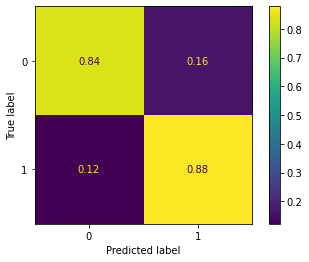

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred, normalize='true')

# versão mais compreensível da matriz confusão
disp = ConfusionMatrixDisplay(confusion_matrix=cm)

disp.plot()
plt.show()

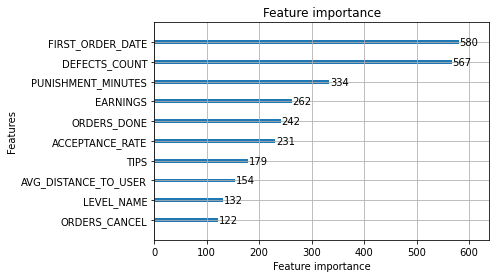

In [ ]:
lgb.plot_importance(lgb_model, max_num_features=10)

### Model Tuning (Otimizar Hiperparâmetros)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

parameters = {
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
    'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000],
    'num_leaves': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15],
    'min_child_samples': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
    'subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'reg_alpha': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'reg_lambda': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'min_split_gain': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'min_child_weight': [0.001, 0.01, 0.1, 1.0, 10.0, 100.0],
    'subsample_freq': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'max_bin': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
    'cat_smooth': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'cat_l2': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'max_cat_to_onehot': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'cat_l2': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'cat_smooth': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'max_cat_threshold': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'metric': ['auc'],
    'n_jobs': [-1],
    'random_state': [42]
}

clf = RandomizedSearchCV(lgb_model, parameters, n_iter=10, verbose=2)

clf.fit(X_train, y_train.squeeze())

In [ ]:
print(clf.best_params_)
print(clf.best_score_)
best_lgb = clf.best_estimator_

{'subsample_freq': 9, 'subsample': 0.5, 'reg_lambda': 0.6, 'reg_alpha': 0.1, 'random_state': 42, 'num_leaves': 60, 'n_jobs': -1, 'n_estimators': 600, 'min_split_gain': 0.9, 'min_child_weight': 10.0, 'min_child_samples': 40, 'metric': 'auc', 'max_depth': 14, 'max_cat_to_onehot': 8, 'max_cat_threshold': 10, 'max_bin': 40, 'learning_rate': 0.01, 'colsample_bytree': 0.7, 'cat_smooth': 4, 'cat_l2': 4}
0.8539034071185402


In [ ]:
print('Acc treino: ', best_lgb.score(X_train, y_train ))
print('Acc teste: ', best_lgb.score(X_test, y_test.squeeze() ))

y_pred = best_lgb.predict(X_test)
print( 'Revocação: ', recall_score( y_test, y_pred ))
print( 'Precisão: ', precision_score( y_test, y_pred ))
print( 'F1_score: ', f1_score( y_test, y_pred ))

Acc treino:  0.8918385695020229
Acc teste:  0.8690319480139577
Revocação:  0.8757073616362575
Precisão:  0.9618161041277627
F1_score:  0.9167441489785618


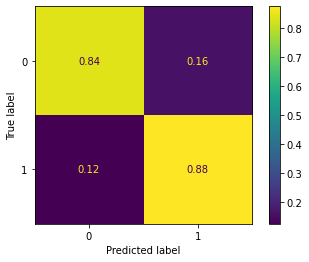

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred, normalize='true')

# versão mais compreensível da matriz confusão
disp = ConfusionMatrixDisplay(confusion_matrix=cm)

disp.plot()
plt.show()

## AdaBoost

### Treinar

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

# Criando o modelo
ada = AdaBoostClassifier()
ada.fit(X_train, y_train.squeeze())

# Predizendo
y_pred = ada.predict(X_test)

### Avaliar

In [ ]:
print('Acc treino: ', ada.score(X_train, y_train ))
print('Acc teste: ', ada.score(X_test, y_test.squeeze() ))

Acc treino:  0.8449378152939414
Acc teste:  0.8522952840636036


In [ ]:
y_pred = ada.predict(X_test)
print( 'Revocação: ', recall_score( y_test, y_pred ))
print( 'Precisão: ', precision_score( y_test, y_pred ))
print( 'F1_score: ', f1_score( y_test, y_pred ))

Revocação:  0.8563453193595046
Precisão:  0.9599476588723901
F1_score:  0.905191722214026


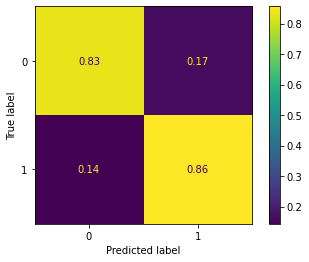

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred, normalize='true')

# versão mais compreensível da matriz confusão
disp = ConfusionMatrixDisplay(confusion_matrix=cm)

disp.plot()
plt.show()

### Model Tuning (Otimizar Hiperparâmetros)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

parameters = {
    'n_estimators': [50, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000],
    'learning_rate': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'algorithm': ['SAMME', 'SAMME.R'],
    'random_state': [42]
}

clf = RandomizedSearchCV(lgb_model, parameters, n_iter=10, verbose=2)

clf.fit(X_train, y_train.squeeze())

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=50, random_state=42; total time=   0.4s
[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=50, random_state=42; total time=   0.4s
[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=50, random_state=42; total time=   0.5s
[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=50, random_state=42; total time=   0.4s
[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=50, random_state=42; total time=   0.4s
[CV] END algorithm=SAMME.R, learning_rate=1000, n_estimators=300, random_state=42; total time=   0.6s
[CV] END algorithm=SAMME.R, learning_rate=1000, n_estimators=300, random_state=42; total time=   0.6s
[CV] END algorithm=SAMME.R, learning_rate=1000, n_estimators=300, random_state=42; total time=   0.6s
[CV] END algorithm=SAMME.R, learning_rate=1000, n_estimators=300, random_state=42; total time=   0.6s
[CV] END algorithm=SAMME.R, learning_rate

RandomizedSearchCV(estimator=LGBMClassifier(),
                   param_distributions={'algorithm': ['SAMME', 'SAMME.R'],
                                        'learning_rate': [0.001, 0.01, 0.1, 1,
                                                          10, 100, 1000],
                                        'n_estimators': [50, 100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000],
                                        'random_state': [42]},
                   verbose=2)

In [ ]:
print(clf.best_params_)
print(clf.best_score_)
best_ada = clf.best_estimator_

{'random_state': 42, 'n_estimators': 50, 'learning_rate': 0.1, 'algorithm': 'SAMME'}
0.8534290094971828


In [ ]:
print('Acc treino: ', best_lgb.score(X_train, y_train ))
print('Acc teste: ', best_lgb.score(X_test, y_test.squeeze() ))

y_pred = best_ada.predict(X_test)
print( 'Revocação: ', recall_score( y_test, y_pred ))
print( 'Precisão: ', precision_score( y_test, y_pred ))
print( 'F1_score: ', f1_score( y_test, y_pred ))

Acc treino:  0.8918385695020229
Acc teste:  0.8690319480139577
Revocação:  0.8774075671834953
Precisão:  0.9607380032787797
F1_score:  0.9171839354872937


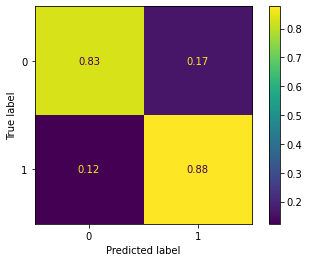

In [ ]:
cm = confusion_matrix(y_test, y_pred, normalize='true')

# versão mais compreensível da matriz confusão
disp = ConfusionMatrixDisplay(confusion_matrix=cm)

disp.plot()
plt.show()

## Random Forest

### Treinar

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Criando o modelo
rf = RandomForestClassifier()
rf.fit(X_train, y_train.squeeze())

# Predizendo
y_pred = rf.predict(X_test)

### Avaliar

In [ ]:
print('Acc treino: ', rf.score(X_train, y_train ))
print('Acc teste: ', rf.score(X_test, y_test.squeeze() ))

Acc treino:  1.0
Acc teste:  0.8638291648383795


In [ ]:
print( 'Revocação: ', recall_score( y_test, y_pred ))
print( 'Precisão: ', precision_score( y_test, y_pred ))
print( 'F1_score: ', f1_score( y_test, y_pred ))

Revocação:  0.8714695358692618
Precisão:  0.9594345421020283
F1_score:  0.9133389183654472


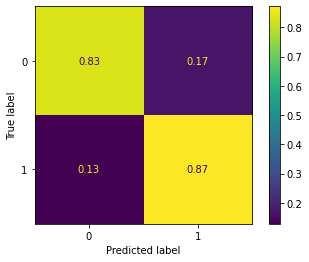

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred, normalize='true')

disp = ConfusionMatrixDisplay(confusion_matrix=cm)

disp.plot()
plt.show()

### Model Tuning (Otimizar Hiperparâmetros)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

parameters = {
    'n_estimators': [4, 6, 9],
    'max_features': ['log2', 'sqrt','auto'],
    'criterion': ['entropy', 'gini'],
    'max_depth': [2, 3, 5, 10],
    'min_samples_split': [2, 3, 5],
    'min_samples_leaf': [1,5,8]
}

clf = RandomizedSearchCV(rf, parameters, n_iter=10, n_jobs=-1, verbose=2)

clf.fit(X_train, y_train.squeeze())

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [2, 3, 5, 10],
                                        'max_features': ['log2', 'sqrt',
                                                         'auto'],
                                        'min_samples_leaf': [1, 5, 8],
                                        'min_samples_split': [2, 3, 5],
                                        'n_estimators': [4, 6, 9]},
                   verbose=2)

In [ ]:
print(clf.best_params_)
print(clf.best_score_)
best_rf = clf.best_estimator_

{'n_estimators': 6, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'max_depth': 10, 'criterion': 'gini'}
0.8421158533063888


In [ ]:
print('Acc treino: ', best_rf.score(X_train, y_train ))
print('Acc teste: ', best_rf.score(X_test, y_test.squeeze() ))

y_pred = best_rf.predict(X_test)
print( 'Revocação: ', recall_score( y_test, y_pred ))
print( 'Precisão: ', precision_score( y_test, y_pred ))
print( 'F1_score: ', f1_score( y_test, y_pred ))

Acc treino:  0.8549023525298437
Acc teste:  0.8624919032992749
Revocação:  0.8736518892582537
Precisão:  0.9555370524562864
F1_score:  0.9127616421649853


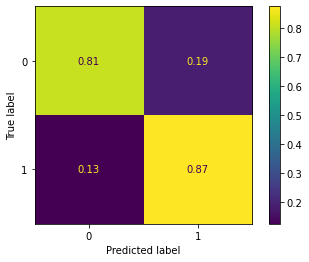

In [ ]:
cm = confusion_matrix(y_test, y_pred, normalize='true')

disp = ConfusionMatrixDisplay(confusion_matrix=cm)

disp.plot()
plt.show()

### Importância das features

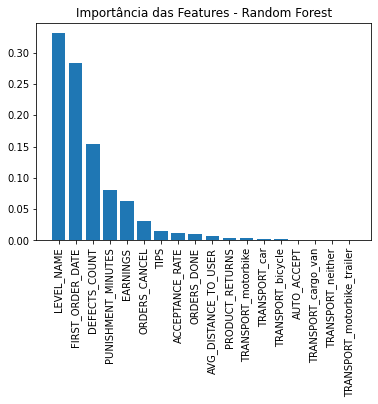

In [ ]:
importances = best_rf.feature_importances_

# Ordenar importância das features em ordem descrescente
indices = np.argsort(importances)[::-1]

# Reorganizar o nome das features para que fiquem de acordo com a ordem de importância
names = [X.columns[i] for i in indices]

# Criar o objeto do gráfico
plt.show()

# Criar um título
plt.title("Importância das Features - Random Forest")

# Adicionar barras
plt.bar(range(X.shape[1]), importances[indices])

# Adicionar nome das features como rótulos do eixo x
plt.xticks(range(X.shape[1]), names, rotation=90)

# Mostrar o gráfico
plt.show()

# Pandas Profiling (Visualização dos Dados)

In [ ]:
!pip install -U pandas-profiling -q
from pandas_profiling import ProfileReport

profile = ProfileReport(df_infos)
profile.to_notebook_iframe()

     |████████████████████████████████| 268 kB 5.3 MB/s 
     |████████████████████████████████| 9.8 MB 19.8 MB/s 
     |████████████████████████████████| 102 kB 68.2 MB/s 
     |████████████████████████████████| 690 kB 68.5 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
     |████████████████████████████████| 4.7 MB 48.8 MB/s 
     |████████████████████████████████| 296 kB 59.9 MB/s 


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
import pickle
from pickle import dump
with open('rf.model', 'wb') as files:
    pickle.dump(best_rf, files)
with open('robust.scaler', 'wb') as files:
    pickle.dump(robust_scaler, files)
with open('standard.scaler', 'wb') as files:
    pickle.dump(standard_scaler, files)